## Etapas

### Parte 1
- **Tamanho do dataset e Distribuição de classes**
- **Realizando alguns checks de sanidade**
    - Verificação de arquivos corrompidos
    - Verificação de tipagem dos arquivos
    - Verificação de canais das imagens
- **Visualizando nosso dataset**
- **Visualizando a distribuição de pixels dos canais por classe**

### Parte 2
- **Identificação de imagens muito escuras e muito claras e remove-las**
- **Identificando duplicatas nos nossos dados**
- **Transformando nossas imagens em uma Feature Matrix**
- **Usar KMeans para clusterizar nossas imagens**
- **Report final**

In [47]:
import math
import os
from pathlib import Path

import matplotlib.pyplot as plt
from matplotlib.image import imread
import seaborn as sns
import numpy as np
import pandas as pd
from PIL import Image

# part 2
from typing import Any

from imagededup.methods import PHash
from imagededup.utils import plot_duplicates
import torch
import torch.nn as nn 
from torchvision import models, transforms
from yellowbrick.cluster import SilhouetteVisualizer, KElbowVisualizer
from sklearn.cluster import KMeans

## Config

In [2]:
TRAIN_PATH = Path("data", "raw", "train")
TEST_PATH = Path("data", "raw", "test")
LABELS_TRAIN_PATH = Path("data", "raw", "train_labels.csv")

## Tamanho do dataset e Distribuição de Classes

In [3]:
files_train_gen = TRAIN_PATH.glob("*.*")
files_train_path_list = [file for file in files_train_gen]

files_test_gen = TEST_PATH.glob("*.*")
files_test_path_list = [file for file in files_test_gen]

print("Training size: {}".format(len(files_train_path_list)))
print("Test size: {}".format(len(files_test_path_list)))

Training size: 220025
Test size: 57458


In [4]:
label_train_df = pd.read_csv(LABELS_TRAIN_PATH)
label_train_df.head()

,id,label
0,f38a6374c348f90b587e046aac6079959adf3835,0
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77,1
2,755db6279dae599ebb4d39a9123cce439965282d,0
3,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08,0
4,068aba587a4950175d04c680d38943fd488d6a9d,0


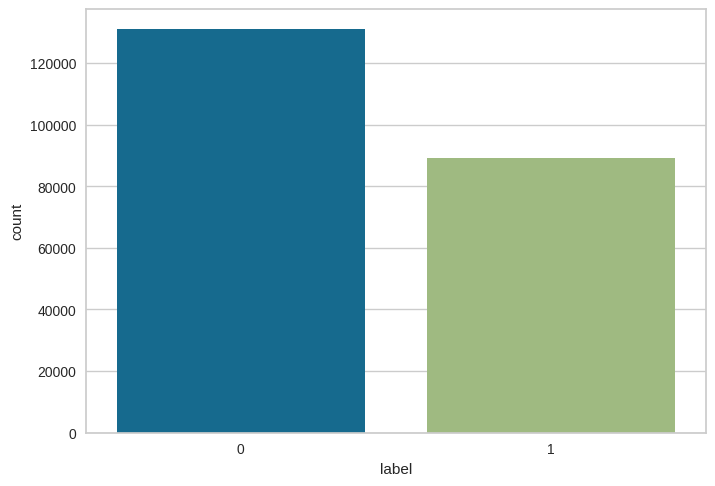

In [5]:
_ = sns.countplot(data=label_train_df, x="label")
plt.show()

In [6]:
label_train_df.value_counts(["label"], normalize=True)

label
0        0.594969
1        0.405031
dtype: float64

## Checks de sanidade

In [7]:
class SanityChecks:
    def __init__(self, path: Path) -> None:
        self.path = path
        self.files_list = self.__get_path_list()
        self.mode_types = []
        self.width = []
        self.height = []

    def __get_path_list(self) -> list:
        files_path_gen = self.path.glob("*.*")
        return [file for file in files_path_gen]

    def check_corruption(self) -> dict:
        error = []
        for file in self.files_list:
            try:
                img = Image.open(file)
                self.mode_types.append(img.mode)
                self.width.append(img.width)
                self.height.append(img.height)
            except:
                error.append(file)
        return {"qt_errors": len(error), "files_erros": error}
    
    def check_typing(self) -> dict:
        print(self.files_list[0])
        ext = [str(file).split(".")[-1] for file in self.files_list]
        return {
            "ext": list(set(ext))
        }
    
    def check_mode(self) -> dict:
        return {
            "modes": list(set(self.mode_types))
        }
    
    def check_dimensions(self) -> dict:
        return {
            "width": list(set(self.width)),
            "height": list(set(self.height))
        }


In [8]:
sanity_checks = SanityChecks(TRAIN_PATH)
print(sanity_checks.check_corruption())
print(sanity_checks.check_typing())
print(sanity_checks.check_mode())
print(sanity_checks.check_dimensions())

{'qt_errors': 0, 'files_erros': []}
data/raw/train/ff36ca3fcc306412eddf0543279305c0fdf2c73c.tif
{'ext': ['tif']}
{'modes': ['RGB']}
{'width': [96], 'height': [96]}


In [9]:
sanity_checks = SanityChecks(TEST_PATH)
print(sanity_checks.check_corruption())
print(sanity_checks.check_typing())
print(sanity_checks.check_mode())
print(sanity_checks.check_dimensions())

{'qt_errors': 0, 'files_erros': []}
data/raw/test/7073833f7ef20abd784565b87f5281e1fa934d4c.tif
{'ext': ['tif']}
{'modes': ['RGB']}
{'width': [96], 'height': [96]}


In [10]:
def plot_images(path: Path | list, sample_size: int, type_path: str = "path"):
    if type_path == "path":
        files_path_gen = path.glob("*.*")
        files = [file for file in files_path_gen]
    elif type_path == "list":
        files = path

    sample = np.random.choice(files, sample_size)

    # adapting rows and columns
    cols = math.ceil(math.sqrt(sample_size))
    rows = math.ceil(math.sqrt(sample_size))

    plt.figure(figsize=(10, 10))
    plt.suptitle("Imagens aleatórias da nossa base de dados")
    for i, file in enumerate(sample):
        img = Image.open(file)
        plt.subplot(rows, cols, i+1)
        plt.imshow(img)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    



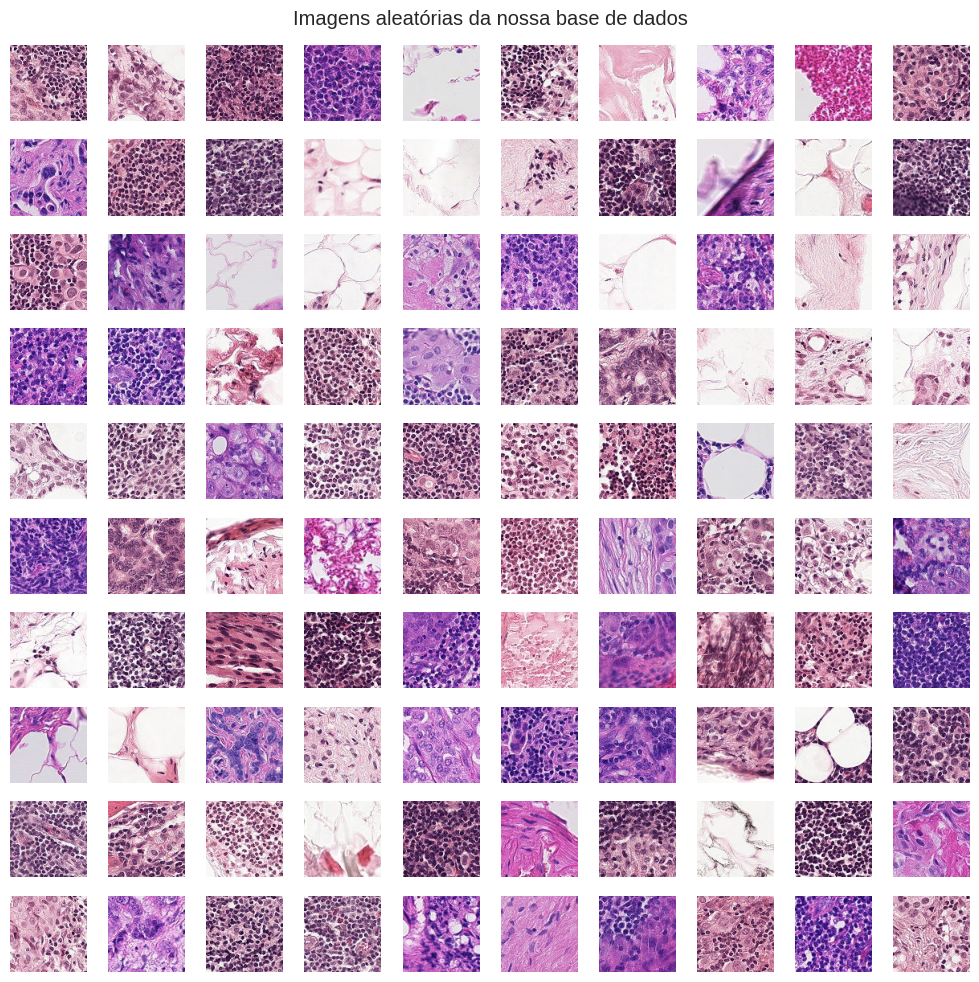

In [11]:
plot_images(TRAIN_PATH, sample_size=100)

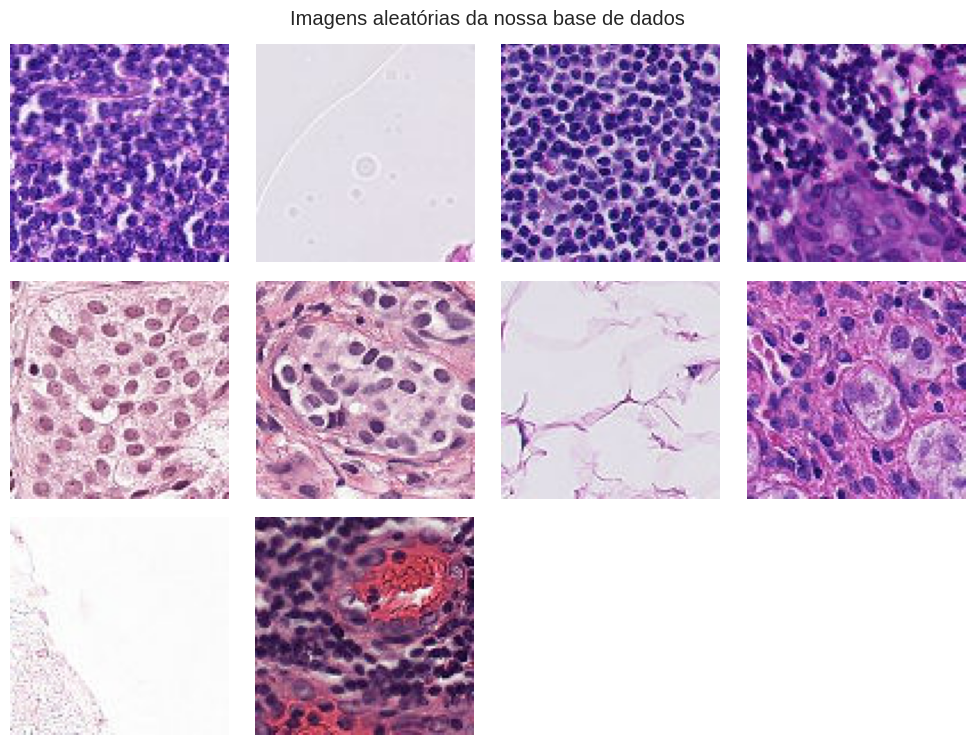

In [12]:
plot_images(TEST_PATH, sample_size=10)

## Visualizando a distribuição de pixels

In [13]:
class PixelsVerify:
    def __init__(self, path: Path, labels_path: Path) -> None:
        self.train_path = path
        self.files = self.__get_path_list()
        self.labels_train_df = pd.read_csv(labels_path)
        self.sample = []
        self.rows = None
        self.cols = None

    def __get_path_list(self) -> list:
        files_path_gen = self.train_path.glob("*.*")
        return [file for file in files_path_gen]

    def __get_rbg_pixels(self, image):
        pixels = image.histogram()
        pixels_r = pixels[:256]
        pixels_g = pixels[256:512]
        pixels_b = pixels[512:]
        return {"r": pixels_r, "g": pixels_g, "b": pixels_b}

    def plot_histograms(self, sample_size):
        self.sample = np.random.choice(self.files, sample_size)

        # extract those labels
        name_ids = [
            str(sample_path).split("/")[-1].split(".")[0] for sample_path in self.sample
        ]

        labels = self.labels_train_df[self.labels_train_df["id"].isin(name_ids)][
            "label"
        ].tolist()

        # adapting rows and columns
        self.cols = math.ceil(math.sqrt(sample_size))
        self.rows = math.ceil(math.sqrt(sample_size))

        plt.figure(figsize=(10, 10))
        plt.suptitle("Histogramas aleatórias da nossa base de dados")
        for i, file in enumerate(self.sample):
            img = Image.open(file)
            pixels = self.__get_rbg_pixels(img)
            plt.subplot(self.rows, self.cols, i + 1)
            plt.plot(list(range(0, 256)), pixels["r"], color="red")
            plt.plot(list(range(0, 256)), pixels["g"], color="green")
            plt.plot(list(range(0, 256)), pixels["b"], color="blue")
            plt.title("{} - {}".format(i, labels[i]))

        plt.tight_layout()
        plt.show()

    def plot_imgs_from_histograms(self):
        plt.figure(figsize=(10, 10))
        plt.suptitle("Imagens aleatórias referente aos Histogramas")
        for i, file in enumerate(self.sample):
            img = Image.open(file)
            plt.subplot(self.rows, self.cols, i+1)
            plt.imshow(img)
            plt.title(f"{i}")
            plt.axis('off')

        plt.tight_layout()
        plt.show()


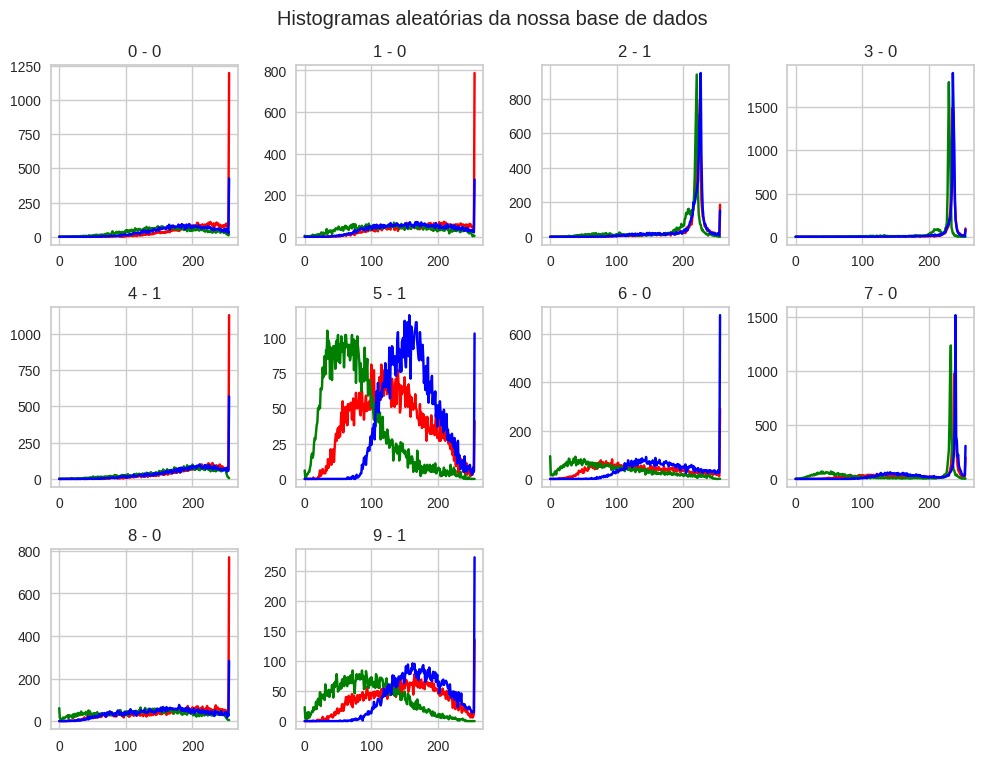

In [14]:
pixels = PixelsVerify(TRAIN_PATH, LABELS_TRAIN_PATH)
pixels.plot_histograms(sample_size=10)

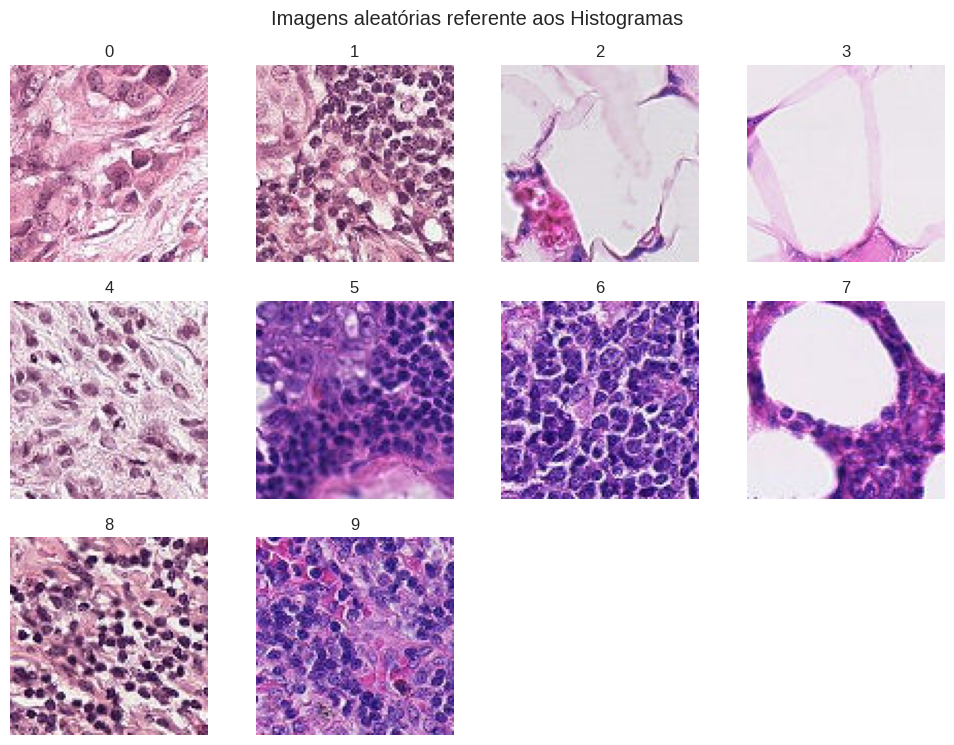

In [15]:
pixels.plot_imgs_from_histograms()

# Parte 2

## Checando por imagens muito claras e muito escuras

In [16]:
class BrightDark:
    def __init__(self, dark_th: float, bright_th: float, files_dir: str | Path) -> None:
        self.dark_th = dark_th / 255
        self.bright_th = bright_th / 255
        self.train_path = files_dir
        self.files = self.__get_path_list()

    def __get_path_list(self) -> list:
        files_path_gen = self.train_path.glob("*.*")
        return [file for file in files_path_gen]
    
    def get_too_bright_images(self):
        too_bright = []

        for i, file in enumerate(self.files):
            image_array = imread(file).reshape(-1, 3)
            mean_px_value = image_array.mean()

            # comparing mean pixels to the threshold
            if (mean_px_value / 255) > self.bright_th:
                too_bright.append(file)
            
        return too_bright

    def get_too_dark_images(self):
        too_dark = []

        for i, file in enumerate(self.files):
            image_array = imread(file).reshape(-1, 3)
            mean_px_value = image_array.mean()

            # comparing mean pixels to the threshold
            if (mean_px_value / 255) < self.dark_th:
                too_dark.append(file)
            
        return too_dark

In [17]:
bright_dark_images = BrightDark(dark_th=55, bright_th=250, files_dir=TRAIN_PATH)
files_bright = bright_dark_images.get_too_bright_images()
files_dark = bright_dark_images.get_too_dark_images()

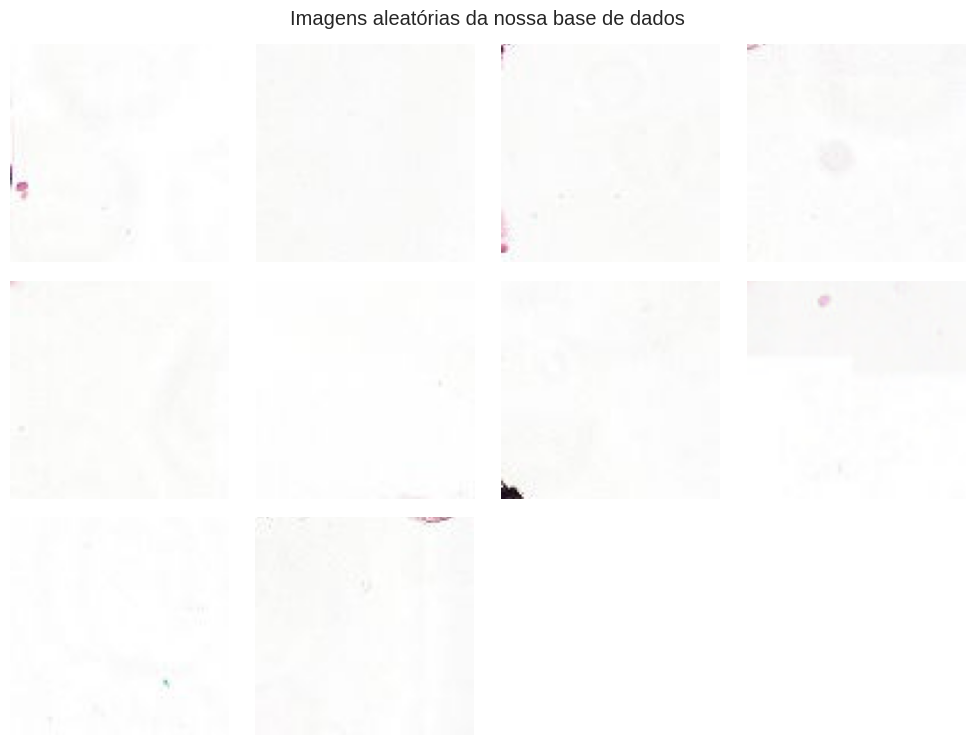

In [18]:
plot_images(files_bright, sample_size=10, type_path="list")

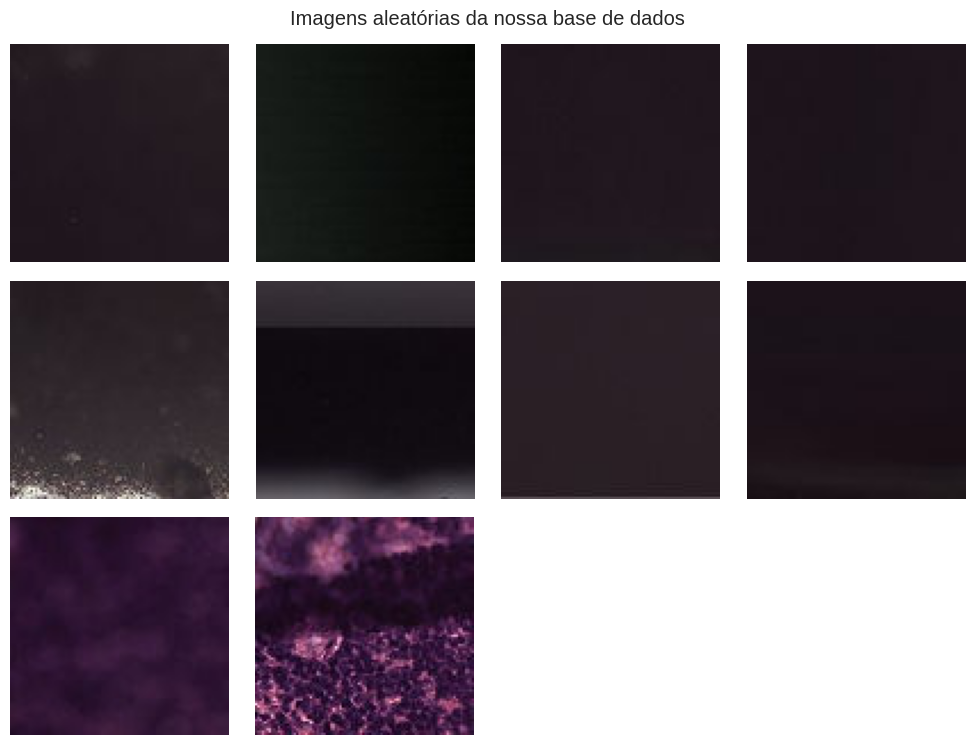

In [19]:
plot_images(files_dark, sample_size=10, type_path="list")

## Investigando imagens duplicadas

In [20]:
phasher = PHash()

encodings = phasher.encode_images(image_dir=TRAIN_PATH)
duplicates = phasher.find_duplicates(encoding_map=encodings) 

2023-01-19 04:39:32,276: INFO Start: Calculating hashes...
100%|██████████| 220025/220025 [00:08<00:00, 24571.25it/s]
2023-01-19 04:39:44,292: INFO End: Calculating hashes!
2023-01-19 04:39:44,311: INFO Start: Evaluating hamming distances for getting duplicates
2023-01-19 04:39:44,312: INFO Start: Retrieving duplicates using Cython Brute force algorithm
100%|██████████| 220025/220025 [55:33<00:00, 66.01it/s]  
2023-01-19 05:35:18,088: INFO End: Retrieving duplicates using Cython Brute force algorithm
2023-01-19 05:35:18,088: INFO End: Evaluating hamming distances for getting duplicates


In [22]:
for img, value in duplicates.items():
    if len(value) > 0:
        print(img)

524b4493f685f8077d289bbc060bca4b9802cba1.tif
e358011c9ba487b79b0173a71640f073020b6caf.tif
2e47aeeb40bde5b51719ad40a1c28f85c253b73c.tif
a6a1740c633cadcd14c109abcdc1d7c540c4012e.tif
a6a9901d038a083722b70250e2dc3941018f4d14.tif
852ab0d66ad23c65861e102efa9afde66aa346af.tif
99877e2b377d7c3781dc2222d6be0be763043264.tif
1019a5464f841bef7490f68ab15fa5e84b5d34c3.tif
9c8ca55f5ae6b83150e183d2fed71c8c5057bddc.tif
c4021a8778186a80aabb44c6d885db64eba9dbb9.tif
be0f8a9e4ca0d9319c245c0dcba3cbd1ba526c44.tif
0330d36350bcc9ed0b6466e7027a31488214015f.tif
66cf37ac5aa32b1f4d08648295e0a738751e19c6.tif
2e474c812a1905e574b2779b9ed6e1c86c712cd0.tif
7c3b6b60970376c6e1b81f645f59df578bb561d4.tif
5a33e68019eca03477524d6b4427a3f3eedd7b3c.tif
2ab4ce4bc6c9ef467bb37b9ee51c0bba8c8b90ca.tif
a5dae0015b2d63f2cf73126364c0e17e1ff63f84.tif
7f3b7e2b070005d0bf4e6a219fc8e8ae2f5e173c.tif
a66c12df47562aa392dcbb6f5dd28c12e5a69f97.tif
2e9a6018cdb8baf12be29671d8c672f315bd42ac.tif
fd08e3698869436ce419c48b4172bf33320d7af4.tif
6095c964f9

In [23]:
duplicates["524b4493f685f8077d289bbc060bca4b9802cba1.tif"]

['88e685f39ab695c8c1b3aebc4f87670357c0f15b.tif']

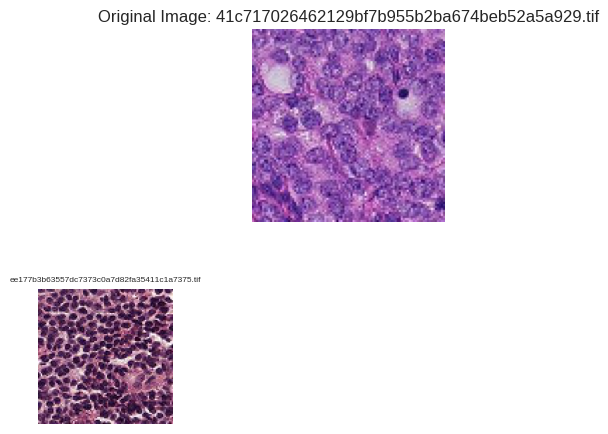

In [26]:
plot_duplicates(
    image_dir=TRAIN_PATH,
    duplicate_map=duplicates,
    filename="41c717026462129bf7b955b2ba674beb52a5a929.tif"
)

## Usando Deep Learning para criar uma matriz de features

In [27]:
vgg16 = models.vgg16(weights=True)

/home/luba/.local/share/virtualenvs/ds-as-a-software-iy38ZIEu/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [28]:
vgg16

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

### Modificando o modelo para o nosso use case

In [29]:
class VGG16Extractor(nn.Module):
    def __init__(self, model):
        super(VGG16Extractor, self).__init__()
        self.features = model.features
        self.pooling = model.avgpool
        self.flatten = nn.Flatten()
        self.fc = model.classifier[0]
    
    def forward(self, x):
        out = nn.Sequential(
            self.features,
            self.pooling,
            self.flatten,
            self.fc
        )
        out = out(x)
        return out

In [30]:
device = "cuda" # "cpu"
feature_extractor_model = VGG16Extractor(vgg16).to(device)

### Criando a matriz de features

In [31]:
class FeatureExtractor:
    def __init__(self, model, file_dir, device) -> None:
        self.model = model
        self.file_dir = file_dir
        self.device = device
        self.files = self.__get_path_list()
        self.transformers = self.__get_transformers()

    def __get_path_list(self) -> list:
        files_path_gen = self.file_dir.glob("*.*")
        return [file for file in files_path_gen]
    
    def __get_transformers(self):
        transfomers = transforms.Compose([
            transforms.CenterCrop(32),
            transforms.Resize(448),
            transforms.ToTensor(),
        ])
        return transfomers

    def __get_features(self, file):
        img = Image.open(file)
        img = self.transformers(img)
        img = img.reshape(1, 3, 448, 448)
        img = img.to(self.device)

        with torch.no_grad():
            features = self.model(img)
        return features

    def get_features(self):
        features = []
        for i, file in enumerate(self.files):
            features.append(self.__get_features(file))
            
        return features
    

In [32]:
feature_matrix = FeatureExtractor(
    model=feature_extractor_model,
    file_dir=TRAIN_PATH,
    device=device
).get_features()

In [43]:
feature_matrix = pd.read_csv("data/curated/feature_matrix_train.csv")
feature_matrix

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,0.089307,0.057466,-1.511272,-2.361004,0.204052,0.331598,-0.707679,-3.085646,-0.127085,-0.420296,...,0.836864,0.528627,-2.982123,0.923244,1.192171,-0.130424,-0.958985,-0.336657,-0.063674,-1.155075
1,0.172228,0.217160,0.132434,-1.287986,-0.033716,-0.063795,-0.228082,-1.452136,-0.418666,-0.266207,...,0.547654,0.338933,-0.635863,0.323177,-0.362378,-0.201997,-1.416427,-0.641334,-0.009420,-0.435063
2,0.143400,-0.004247,-1.327553,-2.336601,0.015691,0.513609,-0.907480,-3.227350,-0.020793,-0.242904,...,0.895553,0.463528,-2.602863,0.671149,0.899283,-0.088987,-1.304461,-0.358188,-0.290991,-0.647253
3,0.191139,0.276255,0.163778,-1.633690,-0.099014,-0.103651,-0.591284,-1.634502,-0.391106,-0.336323,...,0.587317,0.457292,-0.651634,0.360775,-0.057776,-0.551690,-1.348385,-0.755551,0.019920,-0.451686
4,0.251828,0.636232,-1.105089,-2.083029,-0.004438,0.175378,-1.031200,-2.711045,0.256079,-0.308171,...,0.855840,0.535152,-2.163748,0.858762,0.957084,-0.028031,-1.706656,-0.368262,0.100596,-0.750369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220020,-0.087197,-0.410921,-1.804935,-2.069908,0.201729,-0.302639,-0.993075,-3.611366,0.066382,-0.878140,...,0.510826,0.558274,-2.930295,0.695060,1.357568,0.311183,-1.358564,-0.195695,-0.048553,-1.382211
220021,0.410427,0.140241,-0.243856,-1.842974,0.060405,-0.480722,-0.362091,-1.912799,-0.263770,-0.366413,...,0.654834,0.346568,-1.113983,0.629611,-0.035460,0.092242,-1.594563,-0.341624,-0.146231,-0.480717
220022,0.135115,-0.592427,-1.571549,-1.991429,0.036051,0.213014,-1.172803,-3.391929,0.149935,-0.346370,...,0.596961,0.459767,-3.046817,0.913381,1.251820,0.581594,-1.309873,-0.808638,-0.101367,-1.206627
220023,0.075356,-0.621396,-1.822654,-2.049280,0.236024,-0.122106,-1.546053,-3.510508,0.227896,-0.729428,...,0.451096,0.436723,-3.241865,0.557077,1.631777,0.618067,-1.325377,-0.778102,0.229403,-1.341257


## Clusterizando nossas imagens

In [44]:
feature_matrix_sample = feature_matrix.sample(1000)

### Como escolher o melhor cluster?

In [52]:
def plot_silhouette(
    clusters: list | np.ndarray,
    feature_matrix: pd.DataFrame,
) -> None:
    plt.figure(figsize=(8, 12))
    plt.suptitle("Silhouette Plot")
    for i, cluster in enumerate(clusters, start=1):
        km = KMeans(
            n_clusters=cluster,
            init="k-means++",
            n_init=10,
            max_iter=100,
            random_state=42
        )
        plt.subplot(5, 2, i)
        visualizer = SilhouetteVisualizer(km, colors="yellowbrick")
        visualizer.fit(feature_matrix)
        plt.title(f"Clusters: {cluster}")
    
    plt.tight_layout()
    plt.show()

def plot_elbow(
    clusters: list | np.ndarray,
    feature_matrix: pd.DataFrame,
) -> None:
    km = KMeans(
        init="k-means++",
        n_init=10,
        max_iter=100,
        random_state=42
    )
    visualizer = KElbowVisualizer(km, k=clusters)
    visualizer.fit(feature_matrix)
    plt.title("Elbow Plot")

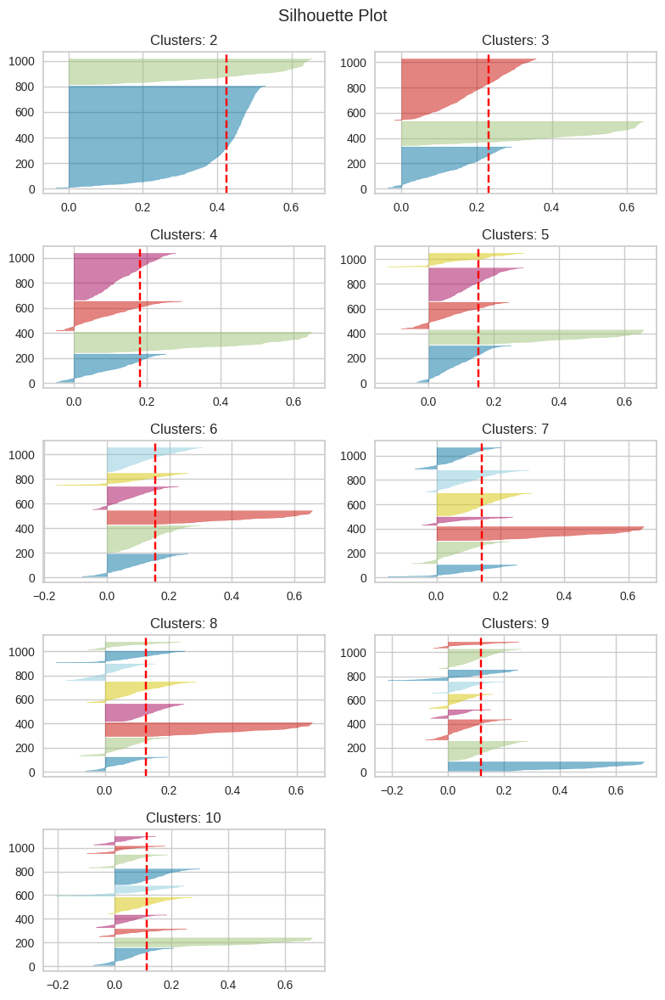

In [51]:
plot_silhouette(
    clusters=[2, 3, 4, 5, 6, 7, 8, 9, 10], feature_matrix=feature_matrix_sample
)


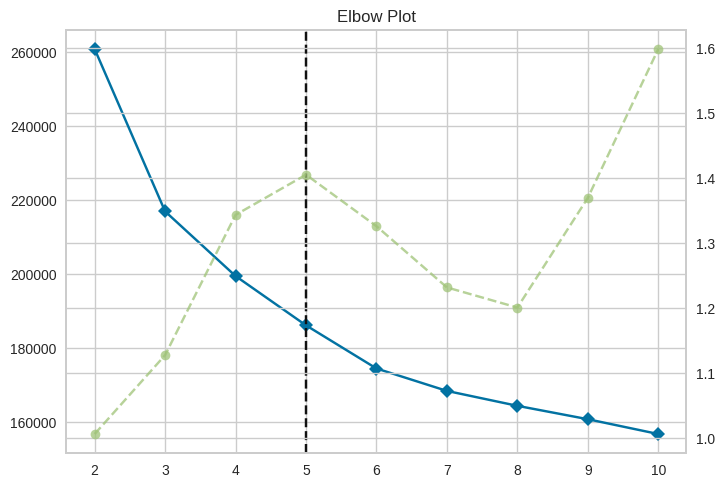

In [53]:
plot_elbow(clusters=[2, 3, 4, 5, 6, 7, 8, 9, 10], feature_matrix=feature_matrix_sample)

### Finalizando a etapa de clustering

In [54]:
model = KMeans(n_clusters=4, init="k-means++", n_init=10, max_iter=100, random_state=42)
model.fit(feature_matrix)
labels = model.labels_

In [56]:
feature_matrix["labels"] = labels
feature_matrix["files"] = [file for file in TRAIN_PATH.glob("*.*")]
feature_matrix.head()

,0,1,2,3,4,5,6,7,8,9,...,4088,4089,4090,4091,4092,4093,4094,4095,labels,files
0,0.089307,0.057466,-1.511272,-2.361004,0.204052,0.331598,-0.707679,-3.085646,-0.127085,-0.420296,...,-2.982123,0.923244,1.192171,-0.130424,-0.958985,-0.336657,-0.063674,-1.155075,0,data/raw/train/ff36ca3fcc306412eddf0543279305c...
1,0.172228,0.217160,0.132434,-1.287986,-0.033716,-0.063795,-0.228082,-1.452136,-0.418666,-0.266207,...,-0.635863,0.323177,-0.362378,-0.201997,-1.416427,-0.641334,-0.009420,-0.435063,1,data/raw/train/524b4493f685f8077d289bbc060bca4...
2,0.143400,-0.004247,-1.327553,-2.336601,0.015691,0.513609,-0.907480,-3.227350,-0.020793,-0.242904,...,-2.602863,0.671149,0.899283,-0.088987,-1.304461,-0.358188,-0.290991,-0.647253,0,data/raw/train/1ad8a68d7de0a6b4624b98e64889259...
3,0.191139,0.276255,0.163778,-1.633690,-0.099014,-0.103651,-0.591284,-1.634502,-0.391106,-0.336323,...,-0.651634,0.360775,-0.057776,-0.551690,-1.348385,-0.755551,0.019920,-0.451686,1,data/raw/train/e358011c9ba487b79b0173a71640f07...
4,0.251828,0.636232,-1.105089,-2.083029,-0.004438,0.175378,-1.031200,-2.711045,0.256079,-0.308171,...,-2.163748,0.858762,0.957084,-0.028031,-1.706656,-0.368262,0.100596,-0.750369,3,data/raw/train/d9d060f3a55912c81018c88e38f4a8f...


### Visualizando cada cluster

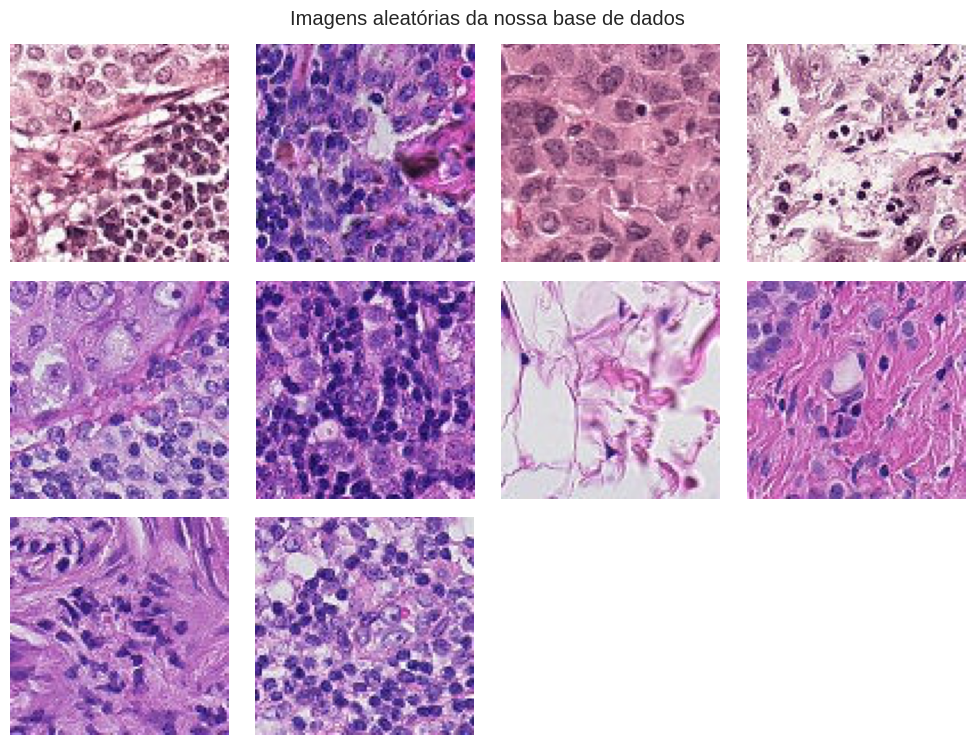

In [58]:
plot_images(
    path=feature_matrix[feature_matrix["labels"] == 0]["files"].tolist(),
    sample_size=10,
    type_path="list"
)

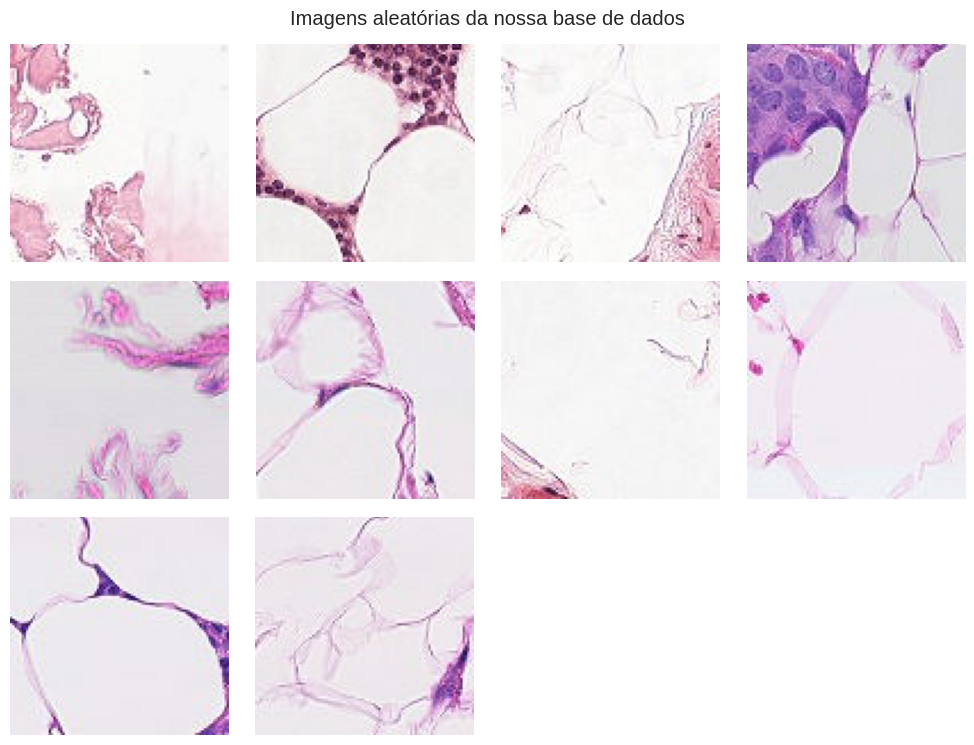

In [61]:
plot_images(
    path=feature_matrix[feature_matrix["labels"] == 1]["files"].tolist(),
    sample_size=10,
    type_path="list"
)

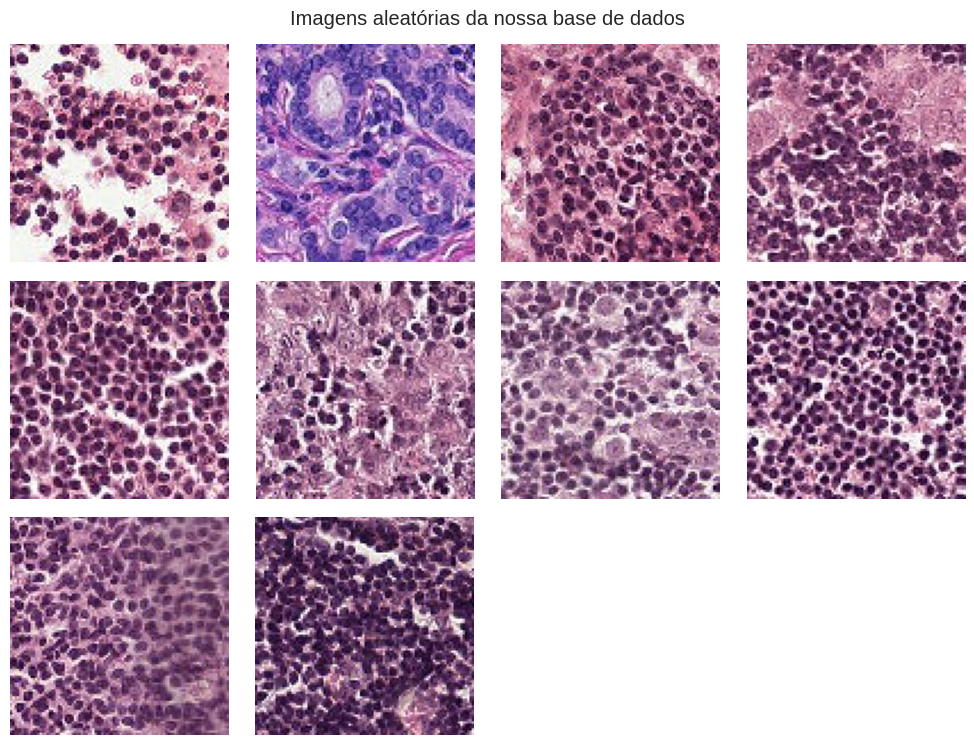

In [63]:
plot_images(
    path=feature_matrix[feature_matrix["labels"] == 2]["files"].tolist(),
    sample_size=10,
    type_path="list"
)

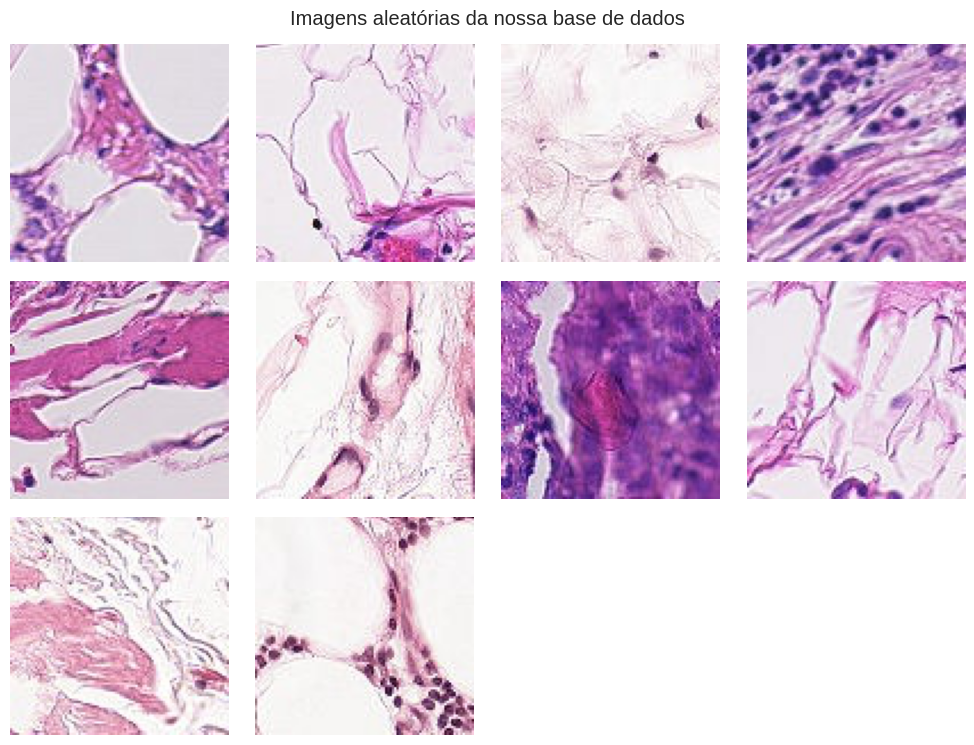

In [67]:
plot_images(
    path=feature_matrix[feature_matrix["labels"] == 3]["files"].tolist(),
    sample_size=10,
    type_path="list"
)